In [1]:
%load_ext autoreload

%autoreload 2

In [2]:
import metroscore.network_builder as mnb
import metroscore.service_areas as msa
import metroscore.utils as mu
import folium
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import partridge as ptg

%config InlineBackend.figure_format = 'retina'

In [3]:
mta_subway_feed = mnb.load_gtfs_feed("../data/google_transit.zip")
nyc_bike = ox.graph_from_place(
    "Manhattan, New York, USA", 
    retain_all=False, 
    truncate_by_edge=True, 
    simplify=True, 
    network_type='bike'
)
nyc_bike = ox.project_graph(nyc_bike)
nyc_bike = ox.add_edge_speeds(nyc_bike)
nyc_bike = ox.add_edge_travel_times(nyc_bike)

In [31]:
node_gdf, edge_gdf, combined, node_dedup = mnb.build_edge_and_node_gdf(mta_subway_feed)

In [5]:
unionsq = (
    mta_subway_feed.stops
    .loc[mta_subway_feed.stops['stop_name'].str.contains('Union Sq')]
    .drop(columns=['parent_station', 'location_type'])
    .set_index("stop_id")
    .to_crs(3857)
)
_103st = (
    mta_subway_feed.stops
    .loc[mta_subway_feed.stops['stop_name'] == '103 St']
    .drop(columns=['parent_station', 'location_type'])
    .set_index("stop_id")
    .to_crs(3857)
)
_103st

,stop_name,geometry
stop_id,,
119N,103 St,POINT (-8234122.285 4982804.849)
119S,103 St,POINT (-8234122.285 4982804.849)
624N,103 St,POINT (-8231795.596 4981504.103)
624S,103 St,POINT (-8231795.596 4981504.103)
A18N,103 St,POINT (-8233351.398 4982311.645)
A18S,103 St,POINT (-8233351.398 4982311.645)


In [6]:
mnb._dedupe_per_stop_name(_103st, tol=180)

,stop_name,geometry,deduped_stops
stop_id,,,
119N,103 St,POINT (-8234122.285 4982804.849),{119S}
624N,103 St,POINT (-8231795.596 4981504.103),{624S}
A18N,103 St,POINT (-8233351.398 4982311.645),{A18S}


In [7]:
unionsq

,stop_name,geometry
stop_id,,
635N,14 St-Union Sq,POINT (-8236523.669 4973284.413)
635S,14 St-Union Sq,POINT (-8236523.669 4973284.413)
L03N,14 St-Union Sq,POINT (-8236610.387 4973301.454)
L03S,14 St-Union Sq,POINT (-8236610.387 4973301.454)
R20N,14 St-Union Sq,POINT (-8236592.353 4973440.579)
R20S,14 St-Union Sq,POINT (-8236592.353 4973440.579)


In [8]:
mnb._dedupe_per_stop_name(unionsq, tol=180)

,stop_name,geometry,deduped_stops
stop_id,,,
635N,14 St-Union Sq,POINT (-8236523.669 4973284.413),"{L03S, R20N, 635S, R20S, L03N}"


In [9]:
deduplicated_stops, mapping = mnb.deduplicate_stops(
    mta_subway_feed.stops[['stop_id', 'stop_name', 'geometry']].set_index("stop_id").to_crs(3857), 
    tol=500
)
deduplicated_stops

,stop_name,geometry
stop_id,,
L06N,1 Av,POINT (-8235597.157 4972737.923)
119N,103 St,POINT (-8234122.285 4982804.849)
624N,103 St,POINT (-8231795.596 4981504.103)
A18N,103 St,POINT (-8233351.398 4982311.645)
706N,103 St-Corona Plaza,POINT (-8222358.153 4975516.524)
...,...,...
J15N,Woodhaven Blvd,POINT (-8221119.835 4967293.204)
401N,Woodlawn,POINT (-8224144.942 4995546.652)
E01N,World Trade Center,POINT (-8238731.135 4970039.563)


In [10]:
deduplicated_stops.query("""stop_name == '103 St'""")

,stop_name,geometry
stop_id,,
119N,103 St,POINT (-8234122.285 4982804.849)
624N,103 St,POINT (-8231795.596 4981504.103)
A18N,103 St,POINT (-8233351.398 4982311.645)


In [11]:
node_gdf

,stop_name,geometry,x,y
stop_id,,,,
L06N,1 Av,POINT (-73.98163 40.73095),-73.981628,40.730953
119N,103 St,POINT (-73.96838 40.79945),-73.968379,40.799446
624N,103 St,POINT (-73.94748 40.79060),-73.947478,40.790600
A18N,103 St,POINT (-73.96145 40.79609),-73.961454,40.796092
706N,103 St-Corona Plaza,POINT (-73.86270 40.74986),-73.862700,40.749865
...,...,...,...,...
J15N,Woodhaven Blvd,POINT (-73.85158 40.69388),-73.851576,40.693879
401N,Woodlawn,POINT (-73.87875 40.88604),-73.878751,40.886037
E01N,World Trade Center,POINT (-74.00978 40.71258),-74.009781,40.712582


In [12]:
subway_network = ox.graph_from_gdfs(node_gdf, edge_gdf)
subway_network = ox.project_graph(subway_network)
# subway_network = ox.consolidate_intersections(subway_network, tolerance=250)

In [13]:
len(subway_network.nodes), len(nyc_bike.nodes)

(465, 7091)

In [16]:
m = ox.graph_to_gdfs(subway_network, nodes=False, edges=True).explore(name="Routes")
m = ox.graph_to_gdfs(subway_network, nodes=True, edges=False).explore(m=m, color='red', radius=50, name="Stops")

folium.LayerControl().add_to(m)

# m.save('nyc_subway_network.html')

m

In [17]:
# save ox graph
filepath = "./nyc_subway_approxshapes.graphml"
ox.save_graphml(subway_network, filepath)

In [32]:
timetable = msa.make_timetable(
    mta_subway_feed.stop_times.assign(
        stop_id=combined["stop_id"].map(lambda x: mapping.get(x, x)),
    )
)
timetable

from  to  
101N  103N    [390.0, 1530.0, 2730.0, 3930.0, 5130.0, 6330.0...
103N  101N    [7830.0, 9030.0, 10230.0, 11430.0, 12630.0, 13...
      104N    [480.0, 1620.0, 2820.0, 4020.0, 5220.0, 6420.0...
104N  103N    [7530.0, 8730.0, 9930.0, 11130.0, 12330.0, 135...
      106N    [570.0, 1710.0, 2910.0, 4110.0, 5310.0, 6510.0...
                                    ...                        
S29N  S30N    [5880.0, 7680.0, 9480.0, 11280.0, 13080.0, 148...
S30N  S29N    [540.0, 2340.0, 4140.0, 5940.0, 7740.0, 9540.0...
      S31N    [6000.0, 7800.0, 9600.0, 11400.0, 13200.0, 150...
S31N  S19N    [25260.0, 26160.0, 27060.0, 27960.0, 28860.0, ...
      S30N    [360.0, 2160.0, 3960.0, 5760.0, 7560.0, 9360.0...
Length: 1097, dtype: object

## Adding Bus Network

In [33]:
mta_manhattan_bus_feed = mnb.load_gtfs_feed("../data/google_transit_manhattan.zip")

In [34]:
bus_node_gdf, bus_edge_gdf, combined, bus_stop_mapping = mnb.build_edge_and_node_gdf(mta_manhattan_bus_feed)

c:\Users\98245\OneDrive\文档\NYU Classes\Metroscore\metroscore-DSC-Qian\metroscore\.venv\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\98245\OneDrive\文档\NYU Classes\Metroscore\metroscore-DSC-Qian\metroscore\.venv\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [35]:
bus_network = ox.graph_from_gdfs(bus_node_gdf, bus_edge_gdf)

In [36]:
len(bus_network.nodes()), len(bus_network.edges())

(1455, 2010)

In [37]:
m = ox.graph_to_gdfs(bus_network, nodes=False, edges=True).explore(name="Routes")
m = ox.graph_to_gdfs(bus_network, nodes=True, edges=False).explore(m=m, color='red', radius=50, name="Stops")

folium.LayerControl().add_to(m)

# m.save('nyc_subway_network.html')

m

In [38]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    bike_and_subway = mu.merge_graphs(a=subway_network, other=bus_network, tol=500)

In [39]:
bike_and_subway['L08N']

AdjacencyView({'L06N': {0: {'length': 0.028269325018469203, 'travel_time': 210.0, 'geometry': <LINESTRING (-8232841.332 4970733.067, -8235597.157 4972737.923)>}}, 'L10N': {0: {'length': 0.007350135372900439, 'travel_time': 180.0, 'geometry': <LINESTRING (-8232841.332 4970733.067, -8232106.957 4970257.067)>}}})

In [40]:
subway_network.get_edge_data('L11N', 'L12N')

{0: {'length': 0.0042905722229100475, 'travel_time': 90.0}}

In [41]:
bus_timetable = msa.make_timetable(
    mta_manhattan_bus_feed.stop_times.assign(
        stop_id=combined["stop_id"].map(lambda x: mapping.get(x, x)),
    )
)
bus_timetable

from    to    
101014  101015    [4680.0, 8280.0, 11880.0, 15480.0, 17280.0, 19...
        101074    [2100.0, 5700.0, 9300.0, 12900.0, 14700.0, 165...
101015  101017    [4746.0, 8346.0, 11946.0, 15546.0, 17346.0, 19...
101017  101018    [4842.0, 8442.0, 12042.0, 15642.0, 17442.0, 19...
        101071    [1980.0, 5580.0, 9180.0, 12780.0, 14580.0, 163...
                                        ...                        
903318  803239    [19714.0, 20554.0, 21274.0, 21994.0, 22714.0, ...
903323  402460    [19200.0, 20040.0, 20760.0, 21480.0, 22200.0, ...
904041  403805    [5340.0, 8040.0, 10680.0, 13380.0, 16080.0, 18...
904242  503853    [7794.0, 9391.0, 11191.0, 12391.0, 13591.0, 14...
904246  804142    [7437.0, 9077.0, 10877.0, 12077.0, 13277.0, 14...
Length: 2010, dtype: object

In [42]:
pd.concat([None, bus_timetable])

from    to    
101014  101015    [4680.0, 8280.0, 11880.0, 15480.0, 17280.0, 19...
        101074    [2100.0, 5700.0, 9300.0, 12900.0, 14700.0, 165...
101015  101017    [4746.0, 8346.0, 11946.0, 15546.0, 17346.0, 19...
101017  101018    [4842.0, 8442.0, 12042.0, 15642.0, 17442.0, 19...
        101071    [1980.0, 5580.0, 9180.0, 12780.0, 14580.0, 163...
                                        ...                        
903318  803239    [19714.0, 20554.0, 21274.0, 21994.0, 22714.0, ...
903323  402460    [19200.0, 20040.0, 20760.0, 21480.0, 22200.0, ...
904041  403805    [5340.0, 8040.0, 10680.0, 13380.0, 16080.0, 18...
904242  503853    [7794.0, 9391.0, 11191.0, 12391.0, 13591.0, 14...
904246  804142    [7437.0, 9077.0, 10877.0, 12077.0, 13277.0, 14...
Length: 2010, dtype: object

In [43]:
full_timetable = pd.concat([timetable, bus_timetable])

In [48]:
sp = msa.time_dependent_dijkstra(
    G=bike_and_subway,
    timetable=full_timetable,
    start_time=0,
    origin_id="L11N"
)

In [678]:
import networkx as nx

In [47]:
sp

{'101N': 13890.0,
 '103N': 13710.0,
 '104N': 12480.0,
 '106N': 12240.0,
 '107N': 12120.0,
 '108N': 12060.0,
 '109N': 10800.0,
 '110N': 10710.0,
 '111N': 10620.0,
 '112N': 10500.0,
 '113N': 10410.0,
 '114N': 10290.0,
 '115N': 9030.0,
 '116N': 8880.0,
 '117N': 8760.0,
 '118N': 7530.0,
 '119N': 7440.0,
 '120N': 6840.0,
 '121N': 7470.0,
 '227N': 7170.0,
 '123N': 5910.0,
 '122N': 7200.0,
 '226N': 8400.0,
 '124N': 5820.0,
 '127N': 5460.0,
 '225N': 8490.0,
 '125N': 5730.0,
 '128N': 5370.0,
 '126N': 5580.0,
 '901N': 5550.0,
 'D17N': 5670.0,
 'R15N': 9180.0,
 'R14N': 9390.0,
 '726N': 5700.0,
 '724N': 6030.0,
 'A25N': 6000.0,
 'A22N': 13110.0,
 'A27N': 6150.0,
 'A15N': 11070.0,
 'D14N': 5970.0,
 '129N': 5310.0,
 '132N': 3963.0,
 'A32N': 5730.0,
 'D16N': 7440.0,
 'D18N': 5790.0,
 'R18N': 2700.0,
 '635N': 2490.0,
 'R13N': 8760.0,
 'B08N': 9540.0,
 '631N': 6120.0,
 'A21N': 13200.0,
 'A28N': 6090.0,
 'A16N': 11250.0,
 'A14N': 13500.0,
 'A12N': 12390.0,
 'D15N': 7290.0,
 'F12N': 6330.0,
 'A20N': 1281

In [680]:
travel_times_from_L11N = dict(map(lambda x: (x[0], x[1] - 0),filter(lambda x: x[1] != np.inf, sp.items())))

nx.set_node_attributes(
    bike_and_subway, 
    travel_times_from_L11N | {n: None for n in set(bike_and_subway.nodes) - set(travel_times_from_L11N.keys())},
    name='travel_time_from_L11N',
    
)

node_colors = ox.plot.get_node_colors_by_attr(bike_and_subway, 'travel_time_from_L11N', cmap='cool', na_color='white')

In [681]:
node_colors.shape

(1920,)

In [682]:
ox.graph_to_gdfs(bus_network, edges=False)

,stop_name,x,y,geometry
osmid,,,,
450222,W 18 ST / 10 AV,-74.005938,40.744323,POINT (-74.00594 40.74432)
401507,9 AV/W 18 ST,-74.003816,40.743200,POINT (-74.00382 40.74320)
404286,W 14 ST/HUDSON ST,-74.004803,40.740620,POINT (-74.00480 40.74062)
401575,W 14 ST/8 AV,-74.002394,40.739621,POINT (-74.00239 40.73962)
401294,W 14 ST/7 AV,-73.999271,40.738287,POINT (-73.99927 40.73829)
...,...,...,...,...
402330,YORK AV/E 63 ST,-73.957570,40.761483,POINT (-73.95757 40.76148)
402331,YORK AV/E 66 ST,-73.956240,40.763333,POINT (-73.95624 40.76333)
402336,YORK AV/E 76 ST,-73.951606,40.769679,POINT (-73.95161 40.76968)


In [683]:
max_time = max(filter(lambda x: x is not None, nx.get_node_attributes(bike_and_subway, 'travel_time_from_L11N').values()))
max_time

82308.0

In [684]:
from matplotlib.cm import ScalarMappable

In [685]:
m = ox.graph_to_gdfs(bike_and_subway, nodes=False, edges=True).explore(name="Routes")
m = ox.graph_to_gdfs(bike_and_subway, nodes=True, edges=False).explore(m=m, color='red', radius=50, name="Stops")

folium.LayerControl().add_to(m)

# m.save('nyc_subway_network.html')

m

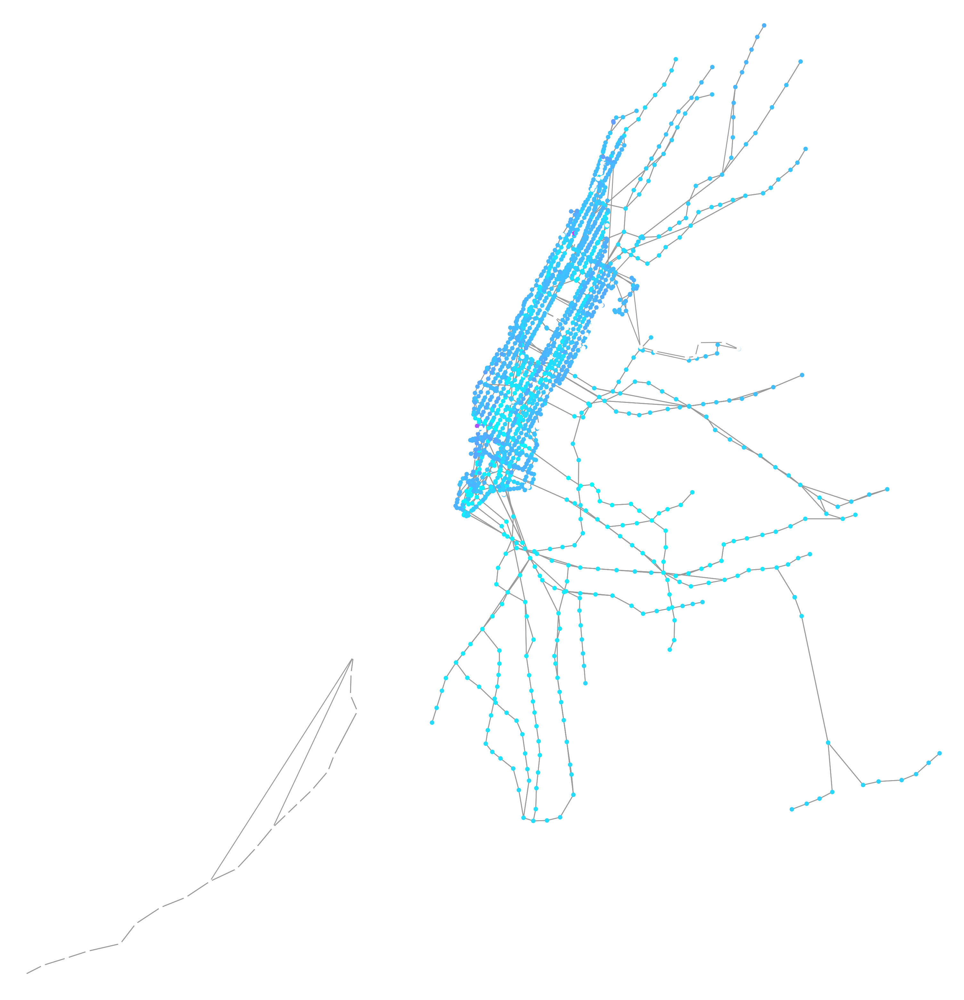

(<Figure size 2000x2000 with 1 Axes>, <Axes: >)

In [686]:
fig, ax = plt.subplots(figsize=(20,20))

ox.plot_graph(bike_and_subway, node_color=node_colors, ax=ax, node_size=25)
# plt.colorbar(ScalarMappable(
#     cmap='cool', 
#     norm=plt.Normalize(0, max_time)), 
#     label='travel time',
#     ax=ax
# )
# plt.show()

## Make service area polygons

In [687]:
bike_and_subway

In [688]:
cutoff

900

In [692]:
# get all nodes accessible within n seconds

travel_times_from_origin = dict(map(lambda x: (x[0], x[1] - 0),filter(lambda x: x[1] != np.inf, sp.items())))

travel_times_from_origin

cutoff = 15 * 60 # 15 minutes
reachable = list(filter(lambda x: x[1] < cutoff, travel_times_from_origin.items()))
max(reachable, key=lambda x: x[1])

('L11N', 0)

In [693]:
travel_times_from_origin

{'101N': 13890.0,
 '103N': 13710.0,
 '104N': 12480.0,
 '106N': 12240.0,
 '107N': 12120.0,
 '108N': 12060.0,
 '109N': 10800.0,
 '110N': 10710.0,
 '111N': 10620.0,
 '112N': 10500.0,
 '113N': 10410.0,
 '114N': 10290.0,
 '115N': 9030.0,
 '116N': 8880.0,
 '117N': 8760.0,
 '118N': 7530.0,
 '119N': 7440.0,
 '120N': 6840.0,
 '121N': 7470.0,
 '227N': 7170.0,
 '123N': 5910.0,
 '122N': 7200.0,
 '226N': 8400.0,
 '124N': 5820.0,
 '127N': 5460.0,
 '225N': 8490.0,
 '125N': 5730.0,
 '128N': 5370.0,
 '126N': 5580.0,
 '901N': 7185.0,
 'D17N': 5670.0,
 'R15N': 9180.0,
 'R14N': 9390.0,
 '726N': 5700.0,
 '724N': 6030.0,
 'A25N': 6210.0,
 'A22N': 13110.0,
 'A27N': 7140.0,
 'A15N': 11070.0,
 'D14N': 5970.0,
 '129N': 5310.0,
 '132N': 3963.0,
 'A32N': 5640.0,
 'D16N': 7440.0,
 'D18N': 6450.0,
 'R18N': 5970.0,
 '635N': 2490.0,
 'R13N': 8760.0,
 'B08N': 9540.0,
 '631N': 6120.0,
 'A21N': 13200.0,
 'A28N': 7140.0,
 'A16N': 11250.0,
 'A14N': 13500.0,
 'A12N': 12390.0,
 'D15N': 7290.0,
 'F12N': 6330.0,
 'A20N': 1281

In [694]:
WALK_SPEED = 1.42 # m/s

# for each terminal node, the buffer will be the number of meters traveler can walk in their remaining time
# buffer = WALK_SPEED * (cutoff - Node time)
reachable_with_buffers = list(map(lambda x: (x[0], x[1], WALK_SPEED * (cutoff - x[1])), reachable))

reachable_with_buffers = pd.DataFrame(reachable_with_buffers, columns=['stop_id', 'time_to_node', 'buffer_at_node']).set_index("stop_id")
reachable_with_buffers

,time_to_node,buffer_at_node
stop_id,,
L11N,0,1278.0


In [695]:
reachable_with_buffers = reachable_with_buffers.merge(
    ox.graph_to_gdfs(bike_and_subway, edges=False)[['geometry']],
    left_index=True,
    right_index=True,
    how='left'
)
# convert to gpd
reachable_with_buffers = gpd.GeoDataFrame(reachable_with_buffers, geometry='geometry', crs=3857)

reachable_with_buffers['buffered'] = reachable_with_buffers['geometry'].buffer(reachable_with_buffers['buffer_at_node'])

In [696]:
from shapely import unary_union
import contextily as cx

In [697]:
list(map(lambda x: x*60, range(10, 60, 10)))

[600, 1200, 1800, 2400, 3000]

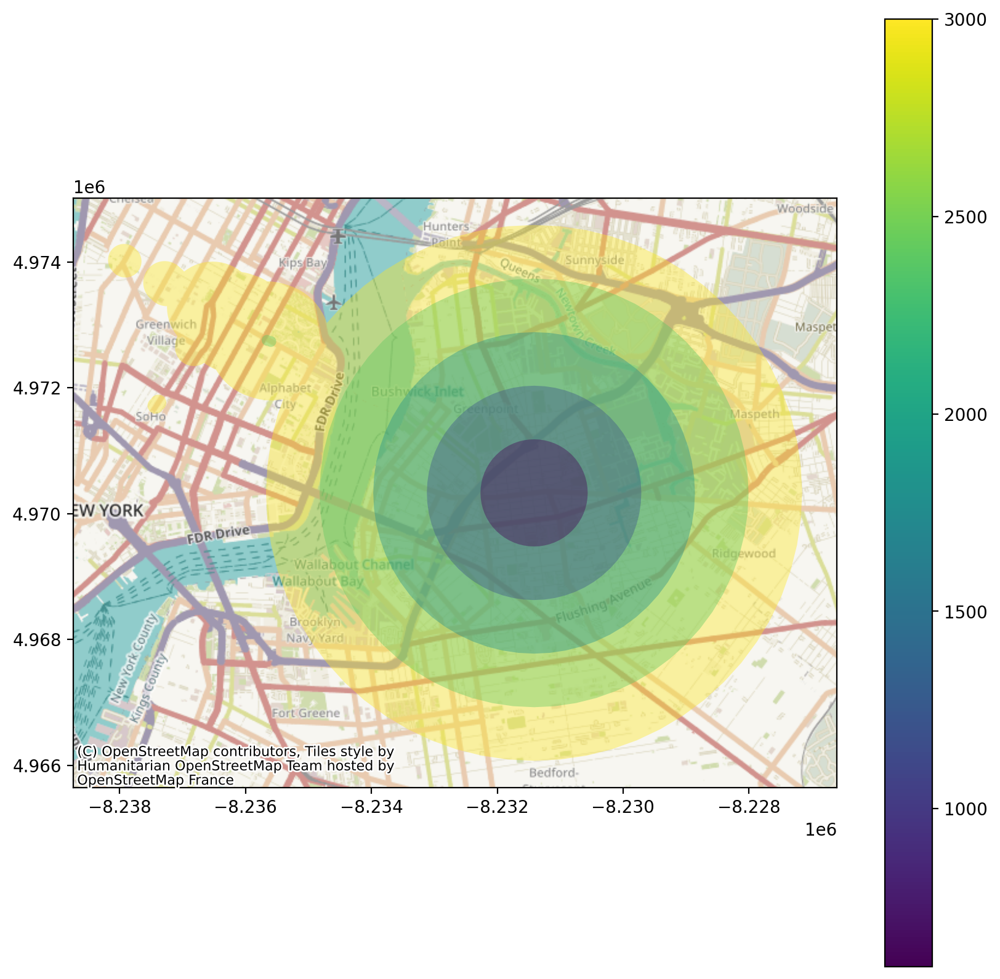

In [698]:
fig, ax = plt.subplots(figsize=(10,10))
transit_areas = msa.get_transit_areas(
    travel_times_from_origin, 
    list(map(lambda x: x*60, range(10, 60, 10))),
    ox.graph_to_gdfs(bike_and_subway, edges=False),
    use_walking_buffer=True,
)
transit_areas = gpd.GeoDataFrame(
    transit_areas.sort_index(ascending=False)
).reset_index(drop=False).rename(columns={"index": "cutoffs", 0: "geometry"})
transit_areas = transit_areas.set_geometry('geometry')
transit_areas.plot(alpha=0.4, ax=ax, column='cutoffs', legend=True, cmap='viridis')
cx.add_basemap(ax)

In [699]:
transit_areas.loc[transit_areas['cutoffs'] == 3000].reset_index().iloc[0]

index                                                       0
cutoffs                                                  3000
geometry    MULTIPOLYGON (((-8237338.6623112485 4971627.96...
Name: 0, dtype: object

In [700]:
place = "New York City, NY"
tags = {"building": True, "water": True}
gdf = ox.features_from_polygon(
    transit_areas.to_crs(4326).loc[transit_areas['cutoffs'] == 3000].reset_index().iloc[0].geometry, 
    tags
)
gdf.shape

(41388, 255)

In [701]:
from shapely import unary_union

In [702]:
transit_areas['geometry'] = transit_areas.to_crs(4326).geometry.difference(unary_union(gdf.geometry.values)).to_crs(3857)

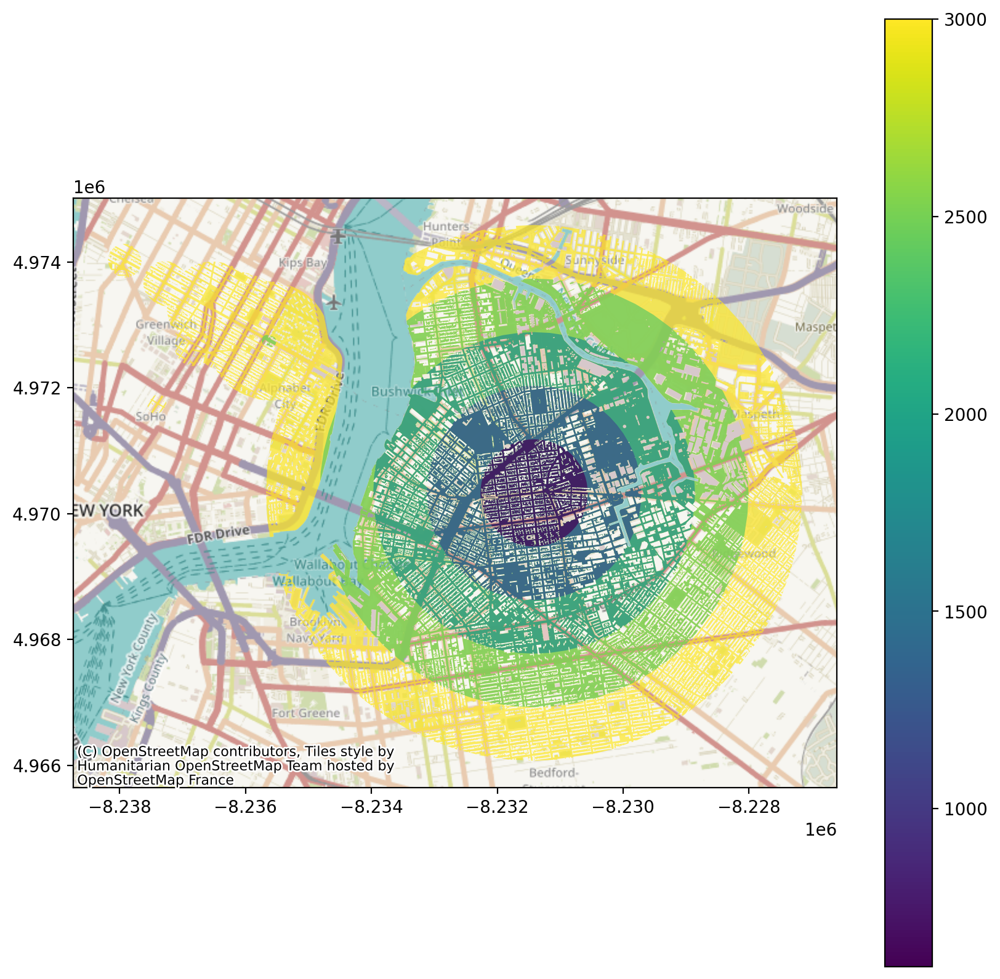

In [703]:
fig, ax = plt.subplots(figsize=(10,10))
transit_areas.plot(alpha=0.7, ax=ax, column='cutoffs', legend=True, cmap='viridis')
cx.add_basemap(ax)
plt.savefig("./figures/graham12am.png")

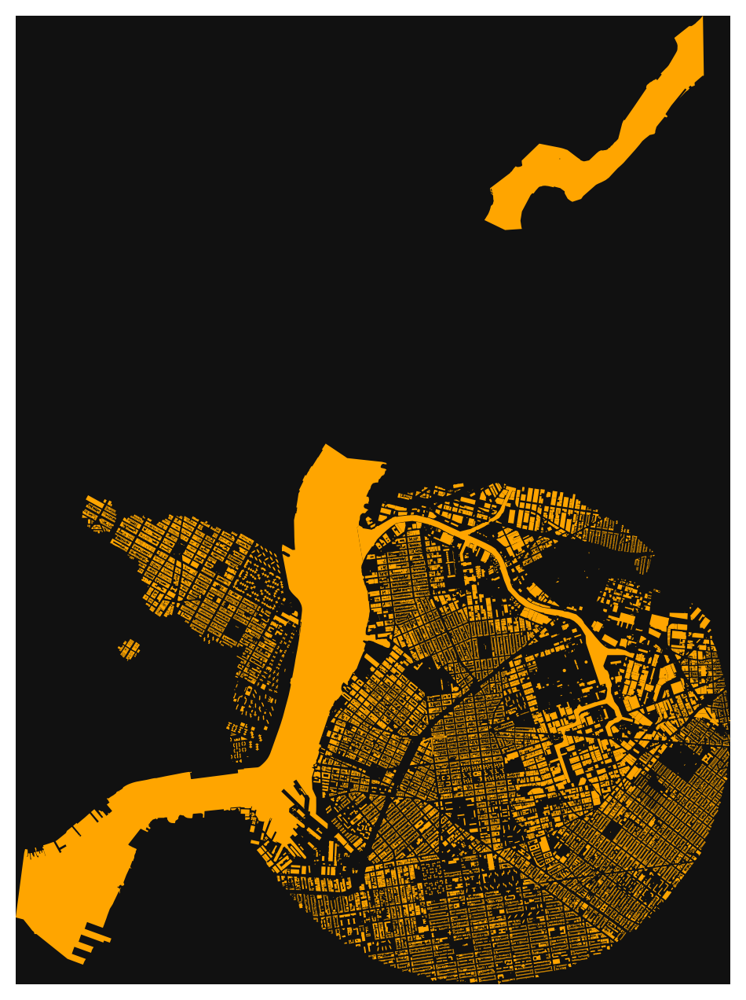

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [704]:
ox.plot.plot_footprints(gdf)